In [1]:
import numpy as np
import os
import re
import pandas as pd
import matplotlib.pyplot as plt

import keras
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Dropout
from keras.layers.convolutional import Conv1D
from keras.layers.convolutional import MaxPooling1D
from keras.preprocessing import sequence

%matplotlib inline

C:\Program Files\Anaconda3\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [2]:
from preprocess import divide_to_train_and_test, one_hot
from confusion_matrix import print_confusion_matrix

In [3]:
import tensorflow as tf
os.environ["CUDA_VISIBLE_DEVICES"] = '0' #use GPU with ID=0
config = tf.ConfigProto()
config.gpu_options.per_process_gpu_memory_fraction = 0.5 # maximun alloc gpu50% of MEM
config.gpu_options.allow_growth = True #allocate dynamically
sess = tf.Session(config = config)

In [4]:
def load_from_directory(texts_directory, images_directory, target_names, max_files_in_one_category=30000):
    file_texts = []
    targets = []
    
    for root, dirs, files in os.walk(images_directory):
        number_used_files = 0
        for name in files:
            if number_used_files < max_files_in_one_category:
            
                name_without_extenstion, _ = os.path.splitext(name)
                
                _, cur_target = os.path.split(root)
                cur_target = target_names.index(cur_target)
            
                text_name = name_without_extenstion + ".txt"
                cur_text_path =  os.path.join(texts_directory, text_name)
                
                try:
                    with open(cur_text_path, encoding="utf-16") as file:
                
                        # считываем файл построчно
                        file_text = ""
                        for line in file.readlines():
                            file_text += (line)
                        if file_text != "" and file_text != " ":
                            file_texts.append(file_text[2:])
                            targets.append(cur_target)
                
                            number_used_files += 1            
                except:
                    print("PROBLEM WITH FILE", cur_text_path)
                
    return file_texts, targets


In [5]:
#let's try to write another version of "load_embeddins"

def load_embeddings(emb_path, max_embeddings_count=100000):
    emb_word_id_to_vector = {}
    word_to_id = {}
    current_word_id = 0
    with open(emb_path, 'r', encoding='utf-8') as f:
        for line in f:
            if current_word_id <= max_embeddings_count:
                line_split = line.strip().split(" ")
                word = line_split[0]
                word_emb = np.array(line_split[1:], dtype=float)
            
                if word_emb.shape != (300,):
                    print("ERROR! Shape is", word_emb.shape, word)
                    continue
            
                word_to_id[word] = current_word_id
                emb_word_id_to_vector[current_word_id] = word_emb
                current_word_id += 1
            else:
                break
            
    return emb_word_id_to_vector, word_to_id

In [6]:
CATEGORIES_COUNT = 11

In [8]:
%%time
file_texts, targets = load_from_directory(texts_directory="D:/svruchtel/DATA/USA_New/Texts",
                                         images_directory="D:/svruchtel/DATA/USA_New/Images_Unite", 
                                         target_names = ["Airfare", "CarRental", "Fuel", "GeneralRetail", "Hotel",
                                                         "Other", "Parking", "Restaurant", "Taxi", "Toll", "Transport"])

Wall time: 1.67 s


In [9]:
%%time
emb_word_id_to_vector, word_to_id = load_embeddings("D:/svruchtel/EMBEDDINGS/wiki.en.vec", 
                                    max_embeddings_count=300000)

ERROR! Shape is (1,) 2519370
ERROR! Shape is (299,) 0.07061
ERROR! Shape is (299,) 0.030699
ERROR! Shape is (299,) -0.19793
ERROR! Shape is (299,) -0.098633
ERROR! Shape is (299,) 0.31768
ERROR! Shape is (299,) -0.5989
ERROR! Shape is (299,) 0.0020116
ERROR! Shape is (299,) -0.34585
ERROR! Shape is (299,) 0.22611
ERROR! Shape is (299,) -0.10483
ERROR! Shape is (299,) -0.0033492
Wall time: 1min 14s


In [10]:
def change_words_to_their_embeddings(file_texts, emb_word_id_to_vector, word_to_id):
    X_emb = []
    
    for text in file_texts:
        embedded_text = []

        words_count = 0

        words = [word for word in text.strip().replace(":", " ").replace(".", " ").replace("!", " ").replace("?", " ").replace(",", " ").replace(";", " ").replace("\n", " ").split(" ") if word != "" ]
        for word in words:
            if words_count < 200:
                if word in word_to_id:
                    embedded_text.append(emb_word_id_to_vector[word_to_id[word]])
                    words_count += 1
                elif word.lower() in word_to_id:
                    embedded_text.append(emb_word_id_to_vector[word_to_id[word.lower()]])
                    words_count += 1
                else:
                    #embedded_text.append(emb_word_id_to_vector[word_to_id["nul"]])
                    print("There is no embedding for word", word)
            else:
                break

        while words_count < 200:
            embedded_text.append(emb_word_id_to_vector[word_to_id["nul"]])
            words_count += 1
    
        X_emb.append(embedded_text)
    return np.array(X_emb)

In [ ]:
%%time
X_emb = change_words_to_their_embeddings(file_texts, emb_word_id_to_vector, word_to_id)

There is no embedding for word Expedia*
There is no embedding for word 10
There is no embedding for word 2017
There is no embedding for word 28
There is no embedding for word 2017
There is no embedding for word 7285684220348
There is no embedding for word 4
There is no embedding for word 2017
There is no embedding for word (CVG)
There is no embedding for word (BEY)
There is no embedding for word �ler
There is no embedding for word 1
There is no embedding for word $2
There is no embedding for word 374
There is no embedding for word 96
There is no embedding for word 8/10/2017
There is no embedding for word |
There is no embedding for word 8/28/2017
There is no embedding for word 1
There is no embedding for word y�
There is no embedding for word i-
There is no embedding for word $624
There is no embedding for word 96
There is no embedding for word nformation
There is no embedding for word $10
There is no embedding for word 00
There is no embedding for word BAHIGE
There is no embedding for

In [12]:
X_emb.shape

(6153, 200, 300)

In [13]:
X_train, targets_train, X_test, targets_test = divide_to_train_and_test(X_emb, targets, num_categories=CATEGORIES_COUNT)
# one-hot encoding for targets
y_train = one_hot(targets_train, classes_count=CATEGORIES_COUNT)
y_test = one_hot(targets_test, classes_count=CATEGORIES_COUNT)

In [14]:
print(X_train[0][0][:5])
print(X_train[1][0][:5])

[-0.3611   -0.060682 -0.16542   0.13046   0.064899]
[ 0.074123 -0.24449  -0.20993   0.067707 -0.069055]


### LET'S RUN LSTM MODELS

### 3

In [15]:
%%time

categories_count = CATEGORIES_COUNT

model = Sequential()
model.add(LSTM(100, input_shape=X_train[0].shape, recurrent_dropout=0.2))
model.add(Dense(categories_count, activation='softmax'))
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
print(model.summary())
callback = keras.callbacks.EarlyStopping(monitor='val_loss', min_delta=0, patience=7, verbose=0, mode='auto')
history = model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=200, batch_size=100, callbacks=[callback])

# Final evaluation of the model
test_scores = model.evaluate(X_test, y_test, verbose=0)
print("Accuracy: %.2f" % (test_scores[1]))


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 100)               160400    
_________________________________________________________________
dense_1 (Dense)              (None, 11)                1111      
Total params: 161,511
Trainable params: 161,511
Non-trainable params: 0
_________________________________________________________________
None
Train on 5531 samples, validate on 622 samples
Epoch 1/200
5531/5531 [==============================] - 74s 13ms/step - loss: 1.8066 - acc: 0.4390 - val_loss: 1.7644 - val_acc: 0.4437
Epoch 2/200
5531/5531 [==============================] - 70s 13ms/step - loss: 1.7442 - acc: 0.4583 - val_loss: 1.7576 - val_acc: 0.4437
Epoch 3/200
5531/5531 [==============================] - 70s 13ms/step - loss: 1.6026 - acc: 0.4925 - val_loss: 1.6343 - val_acc: 0.4598
Epoch 4/200
5531/5531 [==============================] - 70s 13ms/ste

TRAIN CONFUSION MATRIX
Confusion matrix, without normalization
[[ 338    1    0    0    4    5   13    0    1    0    0]
 [   3  131    0    0    0    3    3    0    2    0    0]
 [   1    0   40    1    0    2    5    8    8    0    0]
 [   2    0    0   26    6   61    2  177    0    0    0]
 [   2    0    0    0 2474   10    0    7    0    0    0]
 [  19    5    0    3   12  496   15   23    9    0    1]
 [   0    1    0    0    1    3  103    0    1    0    0]
 [   0    0    0    3   11   38    5  679    2    0    0]
 [   0    2    0    0    0    1   13    3  610    0    1]
 [   0    0    0    0    0    1   15    1   19    0    0]
 [  23   31    0    0    1   12   18    0   12    0    2]]
Normalized confusion matrix
[[9.33701657e-01 2.76243094e-03 0.00000000e+00 0.00000000e+00
  1.10497238e-02 1.38121547e-02 3.59116022e-02 0.00000000e+00
  2.76243094e-03 0.00000000e+00 0.00000000e+00]
 [2.11267606e-02 9.22535211e-01 0.00000000e+00 0.00000000e+00
  0.00000000e+00 2.11267606e-02 2.11

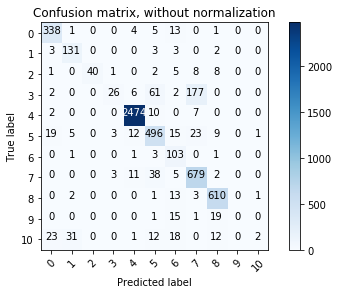

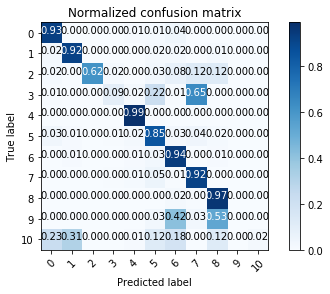

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[ 40   0   0   0   0   0   1   0   0   0   0]
 [  2  11   0   0   0   3   0   0   0   0   0]
 [  0   0   1   1   0   0   2   1   3   0   0]
 [  0   0   0   1   0   4   0  26   0   0   0]
 [  0   1   0   0 215  37  15  10   0   0   0]
 [  6   0   0   0  11  19  11  15   3   0   0]
 [  0   0   0   0   0   1  12   0   0   0   0]
 [  0   0   0   1   3   6   1  72   0   0   0]
 [  0   0   0   0   1   1   3   0  66   0   0]
 [  0   0   0   0   0   0   2   0   2   0   0]
 [  0   5   0   0   0   0   4   1   2   0   0]]
Normalized confusion matrix
[[0.97560976 0.         0.         0.         0.         0.
  0.02439024 0.         0.         0.         0.        ]
 [0.125      0.6875     0.         0.         0.         0.1875
  0.         0.         0.         0.         0.        ]
 [0.         0.         0.125      0.125      0.         0.
  0.25       0.125      0.375      0.         0.        ]
 [0.         0.         0.        

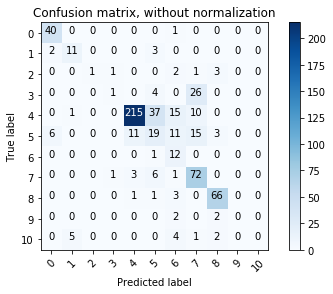

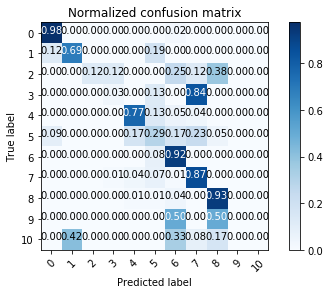

In [16]:
# draw confusion matrix
print("TRAIN CONFUSION MATRIX")
y_pred_train = model.predict(X_train)
print_confusion_matrix(X_train, y_train.argmax(axis=1), y_pred_train.argmax(axis=1), categories_count=CATEGORIES_COUNT)
print("TEST CONFUSION MATRIX")
y_pred_test = model.predict(X_test)
print_confusion_matrix(X_test, y_test.argmax(axis=1), y_pred_test.argmax(axis=1), categories_count=CATEGORIES_COUNT)

In [17]:
print("Val accuracy: %.4f" % (test_scores[1]))

Val accuracy: 0.7026


In [18]:
train_predict = model.predict(X_train)
test_predict = model.predict(X_test)

file_path_train_X = "./LSTM_results_word_emb/USA_3rd_net_train_X_WIKI.EN.npy"
file_path_test_X = "./LSTM_results_word_emb/USA_3rd_net_test_X_WIKI.EN.npy"

np.save(file_path_train_X, train_predict)
np.save(file_path_test_X, test_predict)

## GLOVE word embeddings

In [19]:
%%time
emb_word_id_to_vector, word_to_id = load_embeddings("D:/svruchtel/EMBEDDINGS/glove.840B.300d/glove.840B.300d.txt", 
                                    max_embeddings_count=300000)

ERROR! Shape is (299,) 0.20785
ERROR! Shape is (299,) 0.39511
Wall time: 1min 10s


In [ ]:
%%time
X_emb = change_words_to_their_embeddings(file_texts, emb_word_id_to_vector, word_to_id)

There is no embedding for word Expedia*
There is no embedding for word 7285684220348
There is no embedding for word (CVG)
There is no embedding for word (BEY)
There is no embedding for word �ler
There is no embedding for word $2
There is no embedding for word 8/10/2017
There is no embedding for word 8/28/2017
There is no embedding for word y�
There is no embedding for word i-
There is no embedding for word $624
There is no embedding for word $10
There is no embedding for word BAHIGE
There is no embedding for word ELRAYES-Adult
There is no embedding for word 0578643753685
There is no embedding for word $2
There is no embedding for word $2
There is no embedding for word [AmericanExpress
There is no embedding for word 2002]
There is no embedding for word llaNeve
There is no embedding for word Nick_
There is no embedding for word DellaNeve
There is no embedding for word $6-8k
There is no embedding for word (Business
There is no embedding for word fare)
There is no embedding for word don't


In [21]:
X_emb.shape

(6153, 200, 300)

In [22]:
X_train, targets_train, X_test, targets_test = divide_to_train_and_test(X_emb, targets, num_categories=CATEGORIES_COUNT)
# one-hot encoding for targets
y_train = one_hot(targets_train, classes_count=CATEGORIES_COUNT)
y_test = one_hot(targets_test, classes_count=CATEGORIES_COUNT)

In [23]:
print(X_train[0][0][:5])
print(X_train[1][0][:5])

[-0.21202  -0.057965 -0.53769  -0.49798  -0.21667 ]
[-0.15221   0.23081   0.022262  0.24725   0.28034 ]


In [24]:
%%time

categories_count = CATEGORIES_COUNT

model = Sequential()
model.add(LSTM(100, input_shape=X_train[0].shape, recurrent_dropout=0.2))
model.add(Dense(categories_count, activation='softmax'))
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
print(model.summary())
callback = keras.callbacks.EarlyStopping(monitor='val_loss', min_delta=0, patience=7, verbose=0, mode='auto')
history = model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=200, batch_size=100, callbacks=[callback])

# Final evaluation of the model
test_scores = model.evaluate(X_test, y_test, verbose=0)
print("Accuracy: %.2f" % (test_scores[1]))


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_2 (LSTM)                (None, 100)               160400    
_________________________________________________________________
dense_2 (Dense)              (None, 11)                1111      
Total params: 161,511
Trainable params: 161,511
Non-trainable params: 0
_________________________________________________________________
None
Train on 5531 samples, validate on 622 samples
Epoch 1/200
5531/5531 [==============================] - 59s 11ms/step - loss: 1.7655 - acc: 0.4504 - val_loss: 1.6779 - val_acc: 0.4775
Epoch 2/200
5531/5531 [==============================] - 54s 10ms/step - loss: 1.4682 - acc: 0.5191 - val_loss: 1.3920 - val_acc: 0.5032
Epoch 3/200
5531/5531 [==============================] - 55s 10ms/step - loss: 1.1945 - acc: 0.5961 - val_loss: 1.2763 - val_acc: 0.5691
Epoch 4/200
5531/5531 [==============================] - 56s 10ms/ste

TRAIN CONFUSION MATRIX
Confusion matrix, without normalization
[[ 351    0    0    0    3    4    0    1    0    0    3]
 [   0  136    1    0    0    0    1    0    0    1    3]
 [   0    0   64    0    0    0    1    0    0    0    0]
 [   0    1    2  243    0    8    0   20    0    0    0]
 [   1    0    0    0 2486    1    0    5    0    0    0]
 [   8    0    0    1    2  554    2   10    3    3    0]
 [   0    0    1    0    1    1  105    0    1    0    0]
 [   0    0    0    8    1    4    1  723    1    0    0]
 [   0    0    0    0    0    1    0    0  626    2    1]
 [   0    0    0    0    0    0    0    1    3   29    3]
 [  10    5    0    1    0   10    1    0    8    0   64]]
Normalized confusion matrix
[[9.69613260e-01 0.00000000e+00 0.00000000e+00 0.00000000e+00
  8.28729282e-03 1.10497238e-02 0.00000000e+00 2.76243094e-03
  0.00000000e+00 0.00000000e+00 8.28729282e-03]
 [0.00000000e+00 9.57746479e-01 7.04225352e-03 0.00000000e+00
  0.00000000e+00 0.00000000e+00 7.04

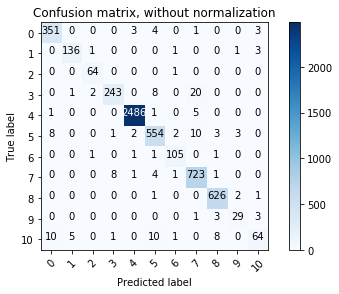

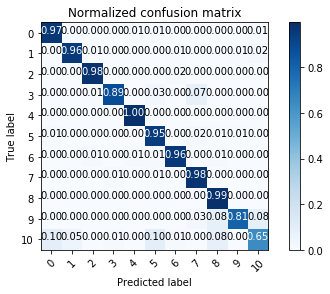

TEST CONFUSION MATRIX
Confusion matrix, without normalization
[[ 41   0   0   0   0   0   0   0   0   0   0]
 [  0  11   0   0   0   0   2   0   0   0   3]
 [  0   0   8   0   0   0   0   0   0   0   0]
 [  0   0   0  15   0   1   0  14   0   1   0]
 [ 33   1   0   0 223   8   0  11   0   0   2]
 [  7   0   0   4   2  31   1  15   3   0   2]
 [  0   0   0   0   0   1  12   0   0   0   0]
 [  0   0   0   4   0   4   0  75   0   0   0]
 [  0   0   0   1   0   0   2   0  66   1   1]
 [  0   0   0   0   0   0   2   0   0   1   1]
 [  0   5   0   0   0   1   1   1   1   0   3]]
Normalized confusion matrix
[[1.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.        ]
 [0.         0.6875     0.         0.         0.         0.
  0.125      0.         0.         0.         0.1875    ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.         0.         0.        ]
 [0.         0.         0.         0.4

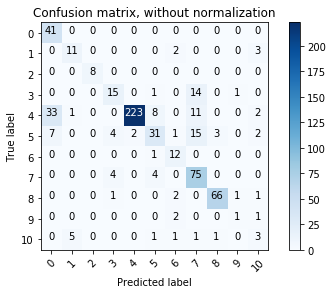

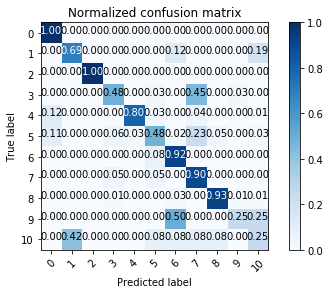

In [25]:
# draw confusion matrix
print("TRAIN CONFUSION MATRIX")
y_pred_train = model.predict(X_train)
print_confusion_matrix(X_train, y_train.argmax(axis=1), y_pred_train.argmax(axis=1), categories_count=CATEGORIES_COUNT)
print("TEST CONFUSION MATRIX")
y_pred_test = model.predict(X_test)
print_confusion_matrix(X_test, y_test.argmax(axis=1), y_pred_test.argmax(axis=1), categories_count=CATEGORIES_COUNT)

In [26]:
print("Val accuracy: %.4f" % (test_scores[1]))

Val accuracy: 0.7814


In [27]:
train_predict = model.predict(X_train)
test_predict = model.predict(X_test)

file_path_train_X = "./LSTM_results_word_emb/USA_3rd_net_train_X_GLOVE.EN.npy"
file_path_test_X = "./LSTM_results_word_emb/USA_3rd_net_test_X_GLOVE.EN.npy"

np.save(file_path_train_X, train_predict)
np.save(file_path_test_X, test_predict)